## Описание проекта
_Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.  
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.    
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно. Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер._

## Описание данных
#### Файл moscow_places.csv:  
**name** — название заведения;  
**address** — адрес заведения;  
**category** — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
**hours** — информация о днях и часах работы;  
**lat** — широта географической точки, в которой находится заведение;  
**lng** — долгота географической точки, в которой находится заведение;  
**rating** — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
**price** — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
**avg_bill** — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
«Средний счёт: 1000–1500 ₽»;  
«Цена чашки капучино: 130–220 ₽»;  
«Цена бокала пива: 400–600 ₽».  
и так далее;  
**middle_avg_bill** — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  
**middle_coffee_cup** — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.  
**chain** — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым  
1 — заведение является сетевым  
**district** — административный район, в котором находится заведение, например Центральный административный округ;  
**seats** — количество посадочных мест.  

In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats as st
from plotly import graph_objects as go
import folium
from folium import Marker, Map
import plotly.express as px
from folium import Map, Choropleth
import folium
from folium.plugins import MarkerCluster

In [81]:
df = pd.read_csv('/Users/nonadoinjashvili/Desktop/moscow_places.csv')

## Шаг 1. Загрузим данные и изучиим общую информацию

In [82]:
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего представлено **8406** заведений.  
Данные 3-ёх типов: **object**, **float64**, и **int**.

## Шаг 2. Выполним предобработку данных

### 2.1 Пропуски и дубликаты

In [84]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [85]:
df.duplicated().sum()

0

In [86]:
df['hours'] = df['hours'].fillna('unknown')

Пропуски правильнее будет оставить, так как их удаление может привести к искажению данных.  
Явный дубликатов не обнаружили, проверим на не явные.

In [87]:
df['name'].nunique()

5614

In [88]:
df['name'] = df['name'].str.upper()
df['name'].nunique()

5512

Выявлено 112 не янвых дубликатов.

### 2.2 Создадим столбец с названиями улиц

In [89]:
def street_f(row):
    address = row['address'].split(', ')
    street = address[1]
    return street

df['street_name'] = df.apply(street_f, axis=1)
df['street_name'].head(5)

0              улица Дыбенко
1              улица Дыбенко
2         Клязьминская улица
3    улица Маршала Федоренко
4        Правобережная улица
Name: street_name, dtype: object

```python
data['address'].str.split(', ').str[1]
```

### 2.3 Создадим столбец с обозначением круглосуточных заведений

In [90]:
def round_the_clock(row):
    clock = row['hours'].split(', ')
    if clock[0]=='ежедневно' and clock[1]=='круглосуточно':
        return True
    else:
        return False

df['is_24/7'] = df.apply(round_the_clock, axis=1)
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Проверили создание 2-ух столбцов, можем ехать дальше.

```python
data['hours'].str.contains('ежедневно, круглосуточно')

```

## Шаг 3. Проанализируем данные

### 3.1 Какие категории заведений представлены в данных?
Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.  
Построим визуализации.

In [91]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [92]:
df_category = df.groupby('category')\
.agg({'name':'count'})\
.sort_values(by='name', ascending=False)\
.reset_index()

df_category

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


Топ 3 категории:  
1. кафе 2378
2. ресторан 2043  
3. кофейня 1413  

In [93]:
category_names = df_category['category'].tolist()
category_total = df_category['name'].tolist()

fig1 = go.Figure(data=[go.Pie(labels=category_names, values=category_total)])
fig1.update_layout(
    title={
        'text': "Quantity by categories",
        'y':0.9,
        'x':0.46,
        'xanchor': 'center',
        'yanchor': 'top'})

fig1.show() 

![title](pie.png)

Построили визуализацию и наглядно видим лидеров категорий.

### 3.2 Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее.  
Построим визуализации. Проанализируем результаты и сделаем выводы.

In [62]:
category_seats = df.groupby('category')\
.agg({'seats':'sum'})\
.sort_values(by='seats', ascending=False)\
.reset_index()

category_seats

,category,seats
0,ресторан,154869.0
1,кафе,118770.0
2,кофейня,83511.0
3,"бар,паб",58281.0
4,пиццерия,40350.0
5,быстрое питание,34513.0
6,столовая,16359.0
7,булочная,13229.0


In [63]:
fig2 = px.bar(category_seats, x='category', y='seats', color='seats')
fig2.update_layout(
    title={
        'text': "Seats by categories",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

Ресторнов меньше, чем кафе, но посадочных мест там больше.

### 3.3 Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.  
Ответим на вопрос - каких заведений больше?

In [26]:
mono = df.query("chain == 0")
net_work = df.query("chain == 1")

print(len(net_work), 'сетевых заведений')
print(len(mono), 'не сетевых заведений')

3205 сетевых заведений
5201 не сетевых заведений


In [27]:
percent_net = (len(net_work)/len(df))
percent_mono = (len(mono)/len(df))

print('Доля сетевых заведений -',np.round(percent_net, 2))
print('Доля не сетевых заведений -',np.round(percent_mono, 2))

Доля сетевых заведений - 0.38
Доля не сетевых заведений - 0.62


Не сетевых заведений больше.

### 3.4 Какие категории заведений чаще являются сетевыми?  
Исследуем данные и ответим на вопрос графиком.

In [28]:
sorted_df = df.sort_values('category', ascending=False)

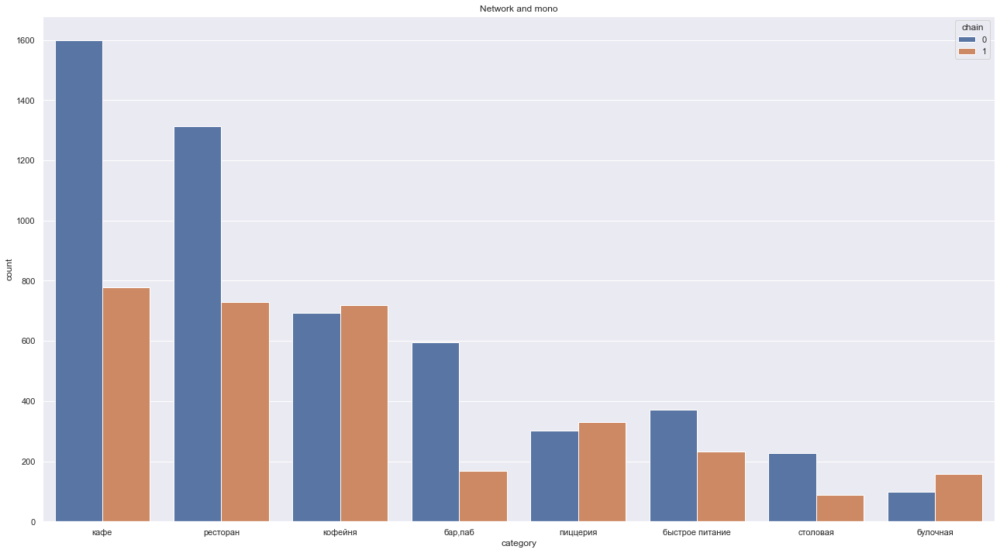

In [31]:
sns.countplot(x='category', hue='chain', data=sorted_df, order=sorted_df['category'].value_counts().index)
sns.set(rc={'figure.figsize':(22,12)})
plt.title('Network and mono')

plt.show()

Сетевыми чаще являются булочные, пиццерии и кофейни.

### 3.5 Сгруппируем данные по названиям заведений и найдём топ-15 популярных сетей в Москве.   
Критерием популярности будем считать количество заведений этой сети в регионе.  
Построим подходящую для такой информации визуализацию.  
Знакомы ли нам эти сети?  
Есть ли какой-то признак, который их объединяет?  
К какой категории заведений они относятся?

In [32]:
net_work.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
13,БУХАНКА,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,Базовская улица,False
19,ПЕКАРНЯ,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,Ижорский проезд,True
20,ЧЕБУРЕКИ МАНТЫ,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0,Правобережная улица,False
23,БУХАНКА,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,Лобненская улица,False


In [33]:
top_15 = net_work.groupby(['name', 'category'])\
.agg({'address':'nunique'})\
.sort_values(by='address', ascending=False)\
.reset_index()\
.head(15)

top_15

,name,category,address
0,ШОКОЛАДНИЦА,кофейня,119
1,ДОМИНО'С ПИЦЦА,пиццерия,76
2,ДОДО ПИЦЦА,пиццерия,74
3,ONE PRICE COFFEE,кофейня,71
4,ЯНДЕКС ЛАВКА,ресторан,69
5,COFIX,кофейня,65
6,PRIME,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,кафе,39
9,ТЕРЕМОК,ресторан,36


In [34]:
fig3 = (px.sunburst(top_15,
    path=['category','name'],
    values='address', 
    title='TOP 15 by categories',
    color_discrete_sequence=px.colors.qualitative.Pastel)
)

fig3.update_layout(margin = dict(t=0, l=0, r=0, b=0))

fig3.show()

### 3.6 Какие административные районы Москвы присутствуют в датасете?  
Отобразиим общее количество заведений и количество заведений каждой категории по районам.  
Проиллюстрируем эту информацию одним графиком.

In [35]:
df['district'].unique().tolist()

['Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Западный административный округ',
 'Центральный административный округ',
 'Восточный административный округ',
 'Юго-Восточный административный округ',
 'Южный административный округ',
 'Юго-Западный административный округ']

In [36]:
df_district = df.groupby(['district', 'category'])\
.agg({'address':'nunique'})\
.sort_values(by='district', ascending=False)\
.reset_index()

df_district

,district,category,address
0,Южный административный округ,столовая,43
1,Южный административный округ,ресторан,161
2,Южный административный округ,пиццерия,71
3,Южный административный округ,кофейня,109
4,Южный административный округ,кафе,230
...,...,...,...
67,Восточный административный округ,булочная,24
68,Восточный административный округ,пиццерия,69
69,Восточный административный округ,ресторан,134
70,Восточный административный округ,столовая,39


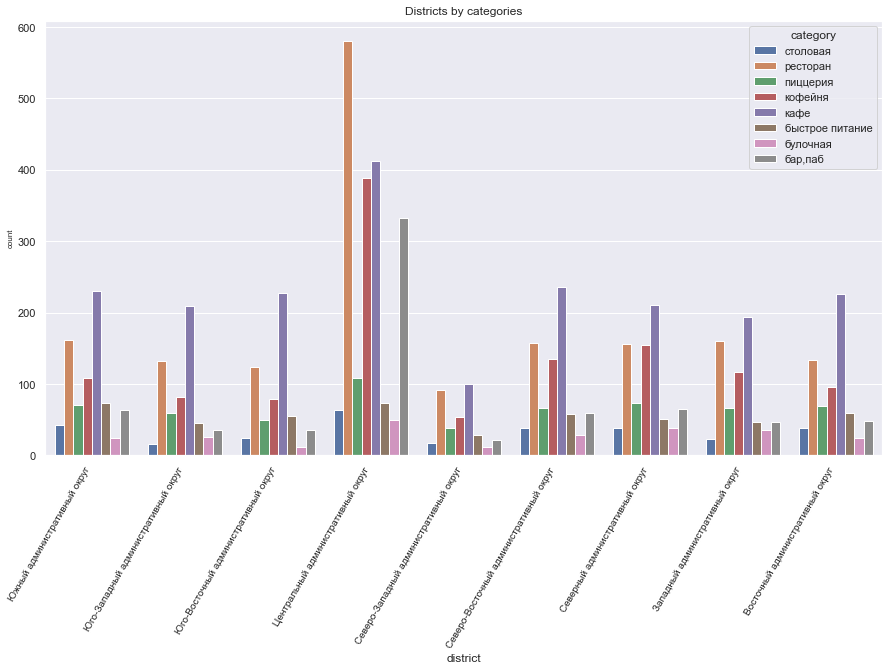

In [37]:
fig = plt.figure(figsize=(15,8))
ax = sns.barplot(x='district', y= 'address', data=df_district, hue='category')
ax.set_xticklabels(ax.get_xticklabels(), rotation=60,  ha="right", fontsize=10)
plt.ylabel('count', fontsize=8)
plt.title('Districts by categories')
plt.show()

Лидирует ЦАО, а в нём - рестораны.  
Во всех остальных округах больше кафе, чем каких либо других категорий.

### 3.7 Визуализируем распределение средних рейтингов по категориям заведений. 
Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [38]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [39]:
rating_category = df.groupby(['category'])\
.agg({'rating':'mean'})\
.sort_values(by='rating', ascending=False)\
.reset_index()

rating_category

,category,rating
0,"бар,паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.290357
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123886
7,быстрое питание,4.050249


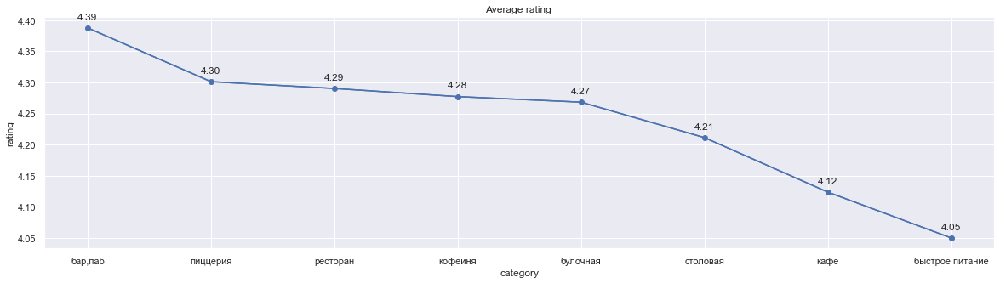

In [42]:
sns.lineplot(data=rating_category, x='category', y='rating')
sns.set(rc={'figure.figsize':(20,5)})
plt.title('Average rating ')
for_x = rating_category.category.tolist()
for_y = rating_category.rating.tolist()
xs = for_x
ys = for_y
plt.plot(xs,ys,'bo-')
for x,y in zip(xs,ys):
    label = "{:.2f}".format(y)
    plt.annotate(label,
                 (x,y),
                 textcoords="offset points",
                 xytext=(0,10),
                 ha='center') 
plt.show()

Наглядно, что отличие в рейтингах не существенное.

### 3.8 Посмострим на  средний рейтинг заведений каждого района.  

In [57]:
rating_district = df.groupby(['district'])\
.agg({'rating':'mean'})\
.sort_values(by='rating', ascending=False)\
.reset_index()

rating_district

,district,rating
0,Центральный административный округ,4.377520
1,Северный административный округ,4.239778
2,Северо-Западный административный округ,4.208802
3,Южный административный округ,4.184417
4,Западный административный округ,4.181551
5,Восточный административный округ,4.174185
6,Юго-Западный административный округ,4.172920
7,Северо-Восточный административный округ,4.148260
8,Юго-Восточный административный округ,4.101120


Средний рейтинг по ЦАО сильно выше остальных.  
При этом большая часть территории в диапазоне от 4.15 до 4.24.

### 3.9 Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [45]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

m

### 3.10 Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района.   
Используем это значение в качестве ценового индикатора района.  
Построим фоновую картограмму (хороплет) с полученными значениями для каждого района.  
Проанализируем цены в центральном административном округе и других.  
Как удалённость от центра влияет на цены в заведениях?

In [46]:
median_bill = df.groupby(['district'])\
.agg({'middle_avg_bill':'median'})\
.sort_values(by='middle_avg_bill', ascending=False)\
.reset_index()

median_bill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [47]:
state_geo = '/Users/nonadoinjashvili/Desktop/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

m

Самый высокий средний чек в центральном и западном округе.

### Выводы по 3 разделу:  

_**1.** ЦАО лидирует сразу по 3 показателям:  
        1) количество заведений  
        2) средний рейтинг  
        3) медианный чек_     
_**2.** Наиболее популярными являются кафе_  
_**3.** Хоть ресторанов и меньше, но общее количество посадочныых мест там больше_

## Шаг 4. Детализируем исследование: открытие кофейни

### 4.1 Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [48]:
df_coffe = df.query("category == 'кофейня'")
print('Всего в датасете кофеен:', df_coffe['name'].count())

Всего в датасете кофеен: 1413


In [49]:
district_coffee = df_coffe.groupby('district')\
.agg({'name':'count'})\
.sort_values(by='name', ascending=False)\
.reset_index()

district_coffee

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


Больше всего кофеен в ЦАО - это явный лидер.  
2-е место за САО и на 3-ем разположился СВАО.

In [50]:
state_geo = '/Users/nonadoinjashvili/Desktop/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=district_coffee,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Кофейни Москвы',
).add_to(m)

m

In [51]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_coffe.apply(create_clusters, axis=1)

# выводим карту
m

Судя по карте, кофейни располагаются радом с дорогами.  
Многие люди не планируют походы за кофе заранее и поэтому такое заведение должно быть на виду у многих, пока они куда то идут или едут.

### 4.2 Есть ли круглосуточные кофейни?

In [52]:
df_coffe[df_coffe['is_24/7'] == True]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
200,WILD BEAN,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,Дмитровское шоссе,True
971,WILD BEAN CAFE,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,Ярославское шоссе,True
1047,WILD BEAN CAFE,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,Ярославское шоссе,True
1214,WILD BEAN CAFE,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,МКАД,True
1291,ШОКОЛАДНИЦА,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица Народного Ополчения,True
1468,КОФЕ ХАУЗ,кофейня,"Москва, Ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,1,NaN,Ленинградский проспект,True
1790,КОФЕМАНИЯ,кофейня,"Москва, Ленинградский проспект, 37А, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,1,15.0,Ленинградский проспект,True
1825,YOU&COFFEE,кофейня,"Москва, улица Золоторожский Вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,1,NaN,улица Золоторожский Вал,True
1883,КОФЕМАНИЯ,кофейня,"Москва, Лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,1,140.0,Лесная улица,True
2030,CINNABON,кофейня,"Москва, Долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,1,230.0,Долгоруковская улица,True


Круглосуточные кофейни существуют и в основном - это сетевые заведения.

### 4.3 Какие у кофеен рейтинги? Как они распределяются по районам?

In [53]:
rating_coffee = df_coffe.groupby('district')\
.agg({'rating':'mean'})\
.sort_values(by='rating', ascending=False)\
.reset_index()

rating_coffee

,district,rating
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
3,Юго-Западный административный округ,4.283333
4,Восточный административный округ,4.282857
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.195333


Средний рейтинг кофеен в диапазоне от 4.19 до 4.33  
Лидерами рейтинга по рейтингу являются ЦАО и СЗАО.

### 4.4 На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [55]:
middle_cup = df_coffe.groupby('district')\
.agg({'middle_coffee_cup':'mean'})\
.sort_values(by='middle_coffee_cup', ascending=False)\
.reset_index()

middle_cup

,district,middle_coffee_cup
0,Западный административный округ,189.938776
1,Центральный административный округ,187.518519
2,Юго-Западный административный округ,184.176471
3,Восточный административный округ,174.023810
4,Северный административный округ,165.789474
5,Северо-Западный административный округ,165.523810
6,Северо-Восточный административный округ,165.333333
7,Южный административный округ,158.488372
8,Юго-Восточный административный округ,151.088235


Можем ориентироваться на стоимость в районе 185 руб за чашку.  
Такая цена будет чуть ниже чем в ЦАО, но немного выше, чем в ЮЗАО.  

Таким образом сохраним цену на хорошем для извлечения прибыли уровне, а ориентироваться будем на район с самым высоким рейтингом (ЦАО) и район с рейтингом выше среднего (ЮЗАО).

## Шаг 5. Рекомендации по открытию кофейни

#### Реккомендации:  
##### 1) Открыть кофейню в ЦАО. В этом округе наивысший рейтинг и спрос на подобные заведения.  
##### 2) Выбрать точку на пересечении улиц и в хорошо проходимом месте.  
##### 3) Установить среднюю цену на чашку кофе на уровне 185 руб.
##### 4) Убедиться, что по близости нет сетевых заведений с более узнаваемым брендом и возможно более низким ценником.
